In [1]:
from graph_tool.all import *
import graph_tool as gt

In [2]:
core = gt.load_graph('../../data/aus_to_aus/1000_indexed.gt')

In [3]:
import helper_functions as hf

In [4]:
state = hf.load_from_pickle('../../data/aus_to_aus/nested_block_state_1000.gt.pickle')

In [5]:
tree, label, order = gt.inference.get_hierarchy_tree(state)

In [6]:
edges_to_draw = int(core.num_edges() * 0.001)
edges_to_draw

61096

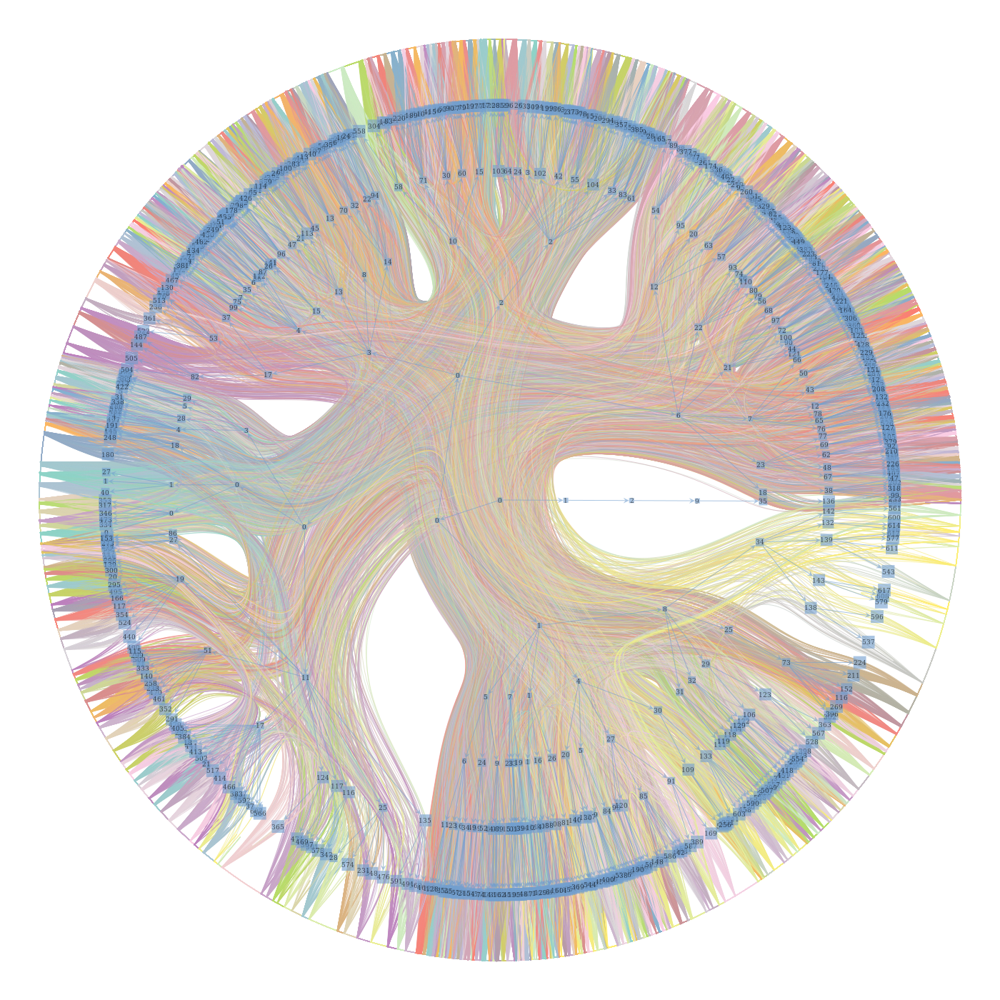

In [7]:
pos,t,tpos = state.draw(subsample_edges=edges_to_draw,
           hvprops={'text': label, 'font_size': 9},
           vprops={'text': None}, output_size=(1400,1400))

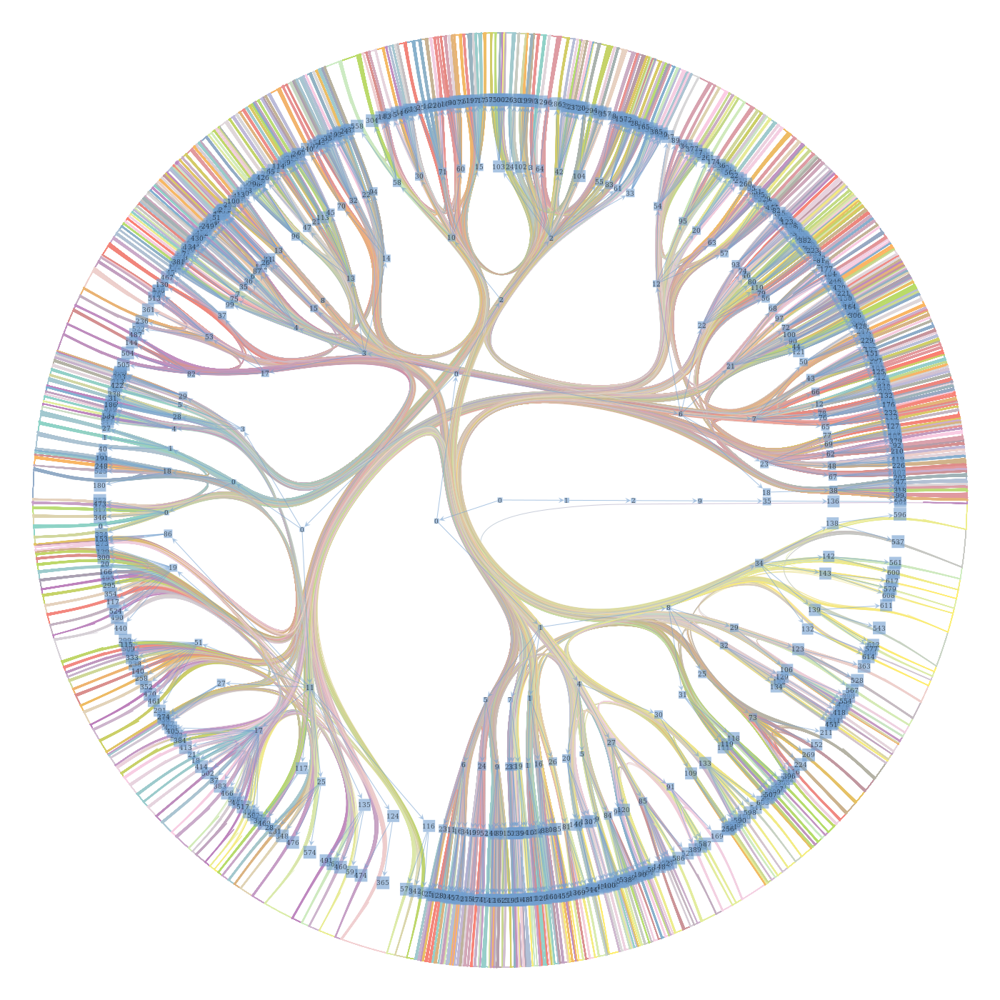

In [8]:
pos,t,tpos = state.draw(subsample_edges=edges_to_draw,
           hvprops={'text': label, 'font_size': 9},
           vprops={'text': None}, output_size=(1400,1400), beta=0.98)

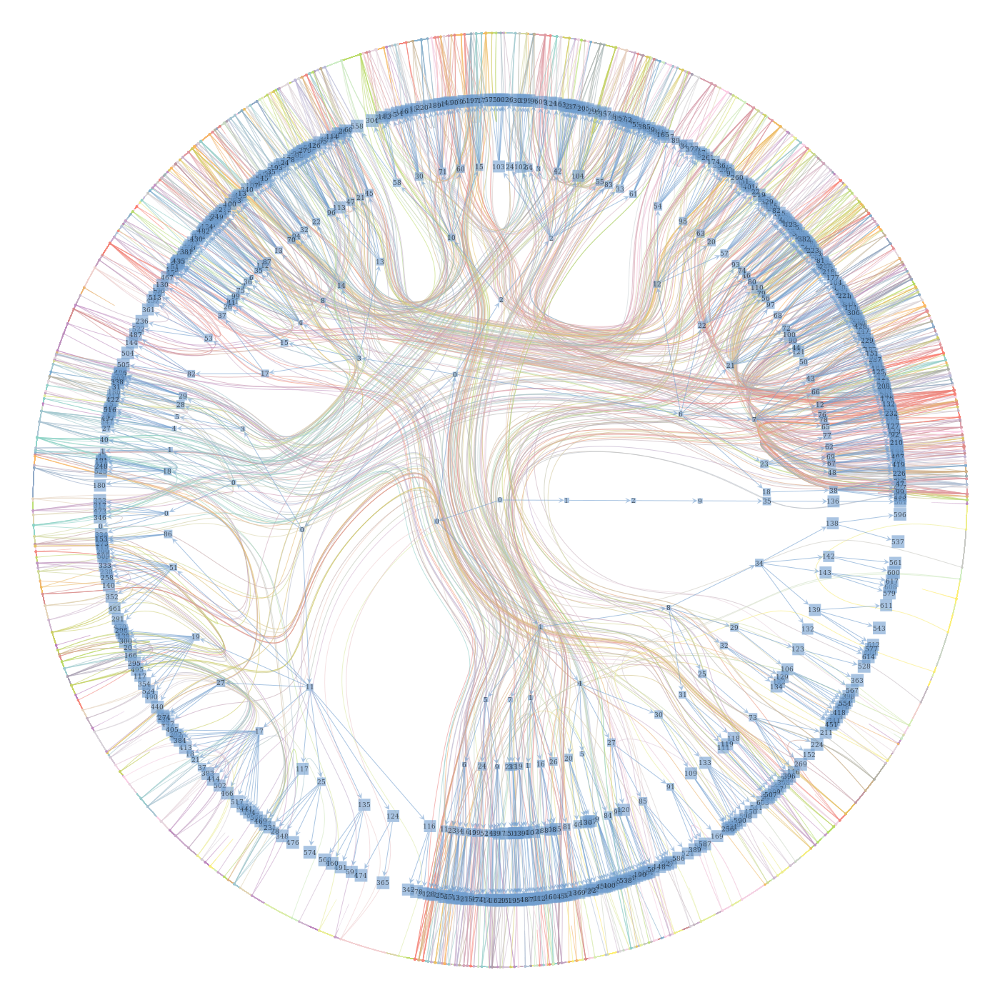

In [9]:
pos,t,tpos = state.draw(subsample_edges=1000,
           hvprops={'text': label, 'font_size': 9},
           vprops={'text': None}, output_size=(1400,1400))

In [10]:
import numpy as np

hierarchy_levels = state.get_bs()

core.vp['group'] = core.new_vertex_property("int")
core.vp['group'].a = hierarchy_levels[0]

In [11]:
%%time

projected_states = {}

for level in range(len(hierarchy_levels)):
    projected_states[level] = state.project_level(level)
    print(level)

0
1
2
3
4
5
6
CPU times: user 11min 38s, sys: 3min 11s, total: 14min 50s
Wall time: 25min 43s


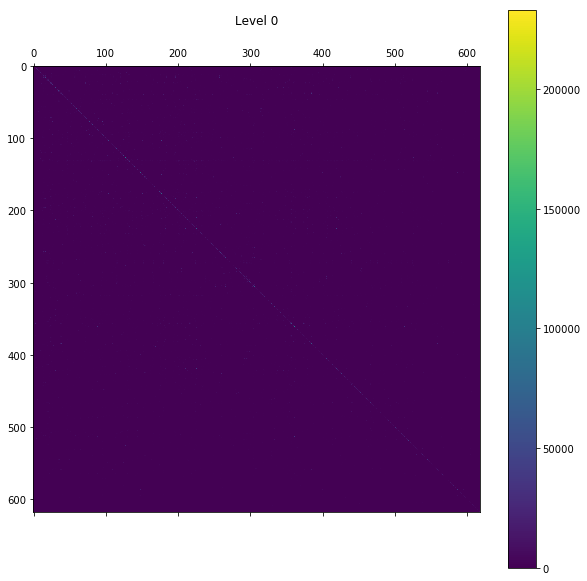

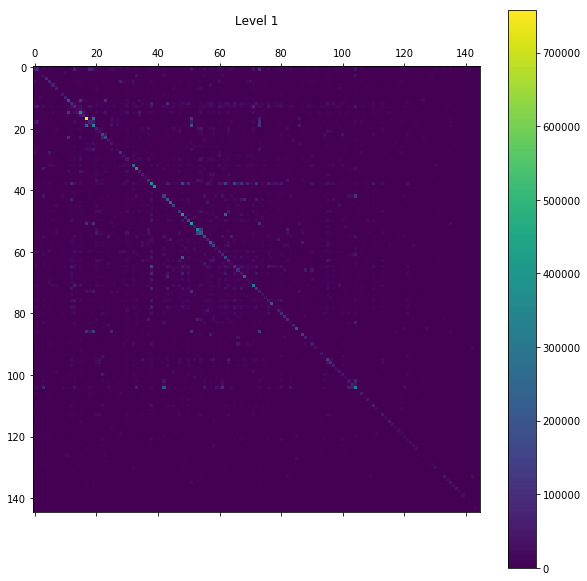

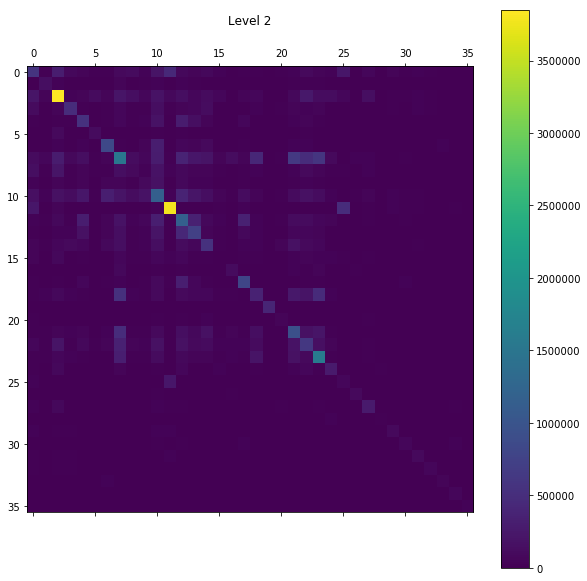

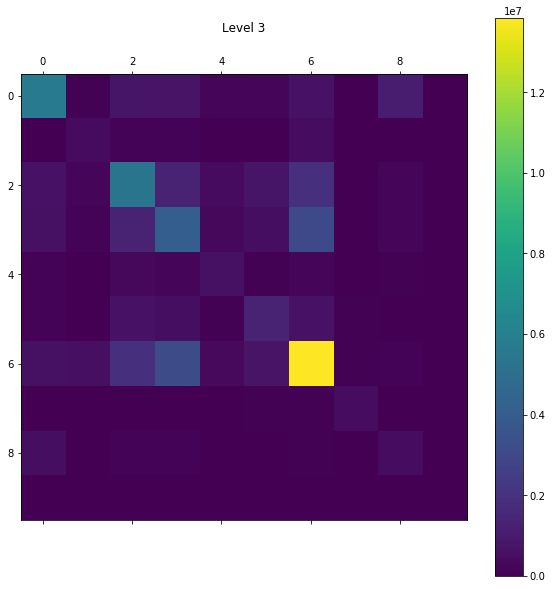

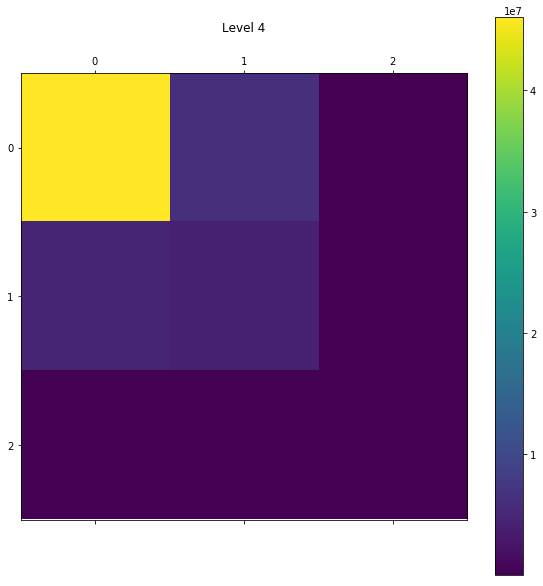

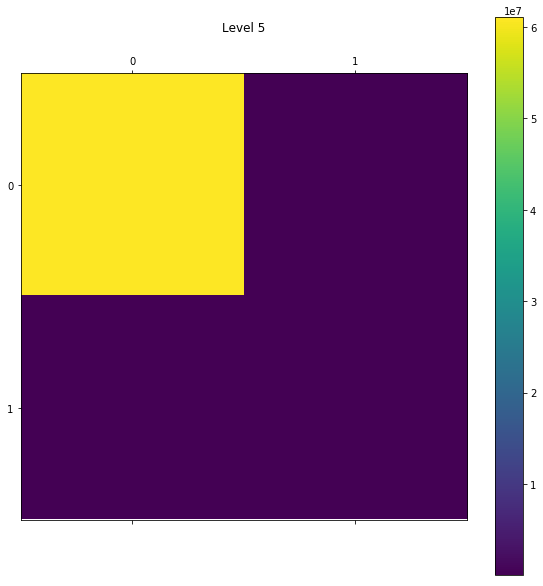

In [12]:
import matplotlib.pyplot as plt

for level in range(len(hierarchy_levels)):
    
    if level == len(hierarchy_levels) - 1:
        break
    
    plt.figure(figsize=(10,10))
    
    plt.matshow(projected_states[level].get_matrix().todense(), fignum=1)
    
    plt.title('Level {}'.format(level), y=1.08)
    
    plt.colorbar()

    plt.show()

In [13]:
keyword_tables = hf.load_from_pickle('../../data/austwittersphere1000/1000plus_keyword_tables.pickle')

In [14]:
numeric_results = hf.load_from_pickle('../../data/austwittersphere1000/1000plus_keywords_numeric_results.pickle')

In [15]:
treshold = 0.05

[' '.join(numeric_results[2][i][numeric_results[2][i]['fraction'] > treshold].index.values[:5]) for i in numeric_results[2]]

['',
 'hobart tasmania tasmanian tassie launceston',
 'league players player season winx',
 'games',
 'like night tonight people',
 'racing',
 'wines tasting wine shiraz',
 'research health nsw science auspol',
 '',
 'ttot travel',
 'marketing tips guide',
 'im wanna ur grammy lmao',
 'startup marketing business tech customer',
 'design tech product',
 'adelaide arts theatre exhibition artists',
 '',
 'wildoz conservation books species authors',
 '',
 'auspol trump coal turnbull political',
 'eurusd pips hatches forex',
 '',
 'students research learning teachers library',
 'qld queensland police severe residents',
 'lnp turnbull auspol abbott alp',
 'perth perthnews fyfe freo wa',
 'grammy grammys',
 'iartg amwriting 99cents amreading asmsg',
 'cum sexy horny cock tits',
 '',
 'soundcloud remix dj',
 '',
 '',
 'esports overwatch lan twitch cod',
 'burglary',
 'في من yang على lagi',
 'dicky eth ethereum hittin ฎก']

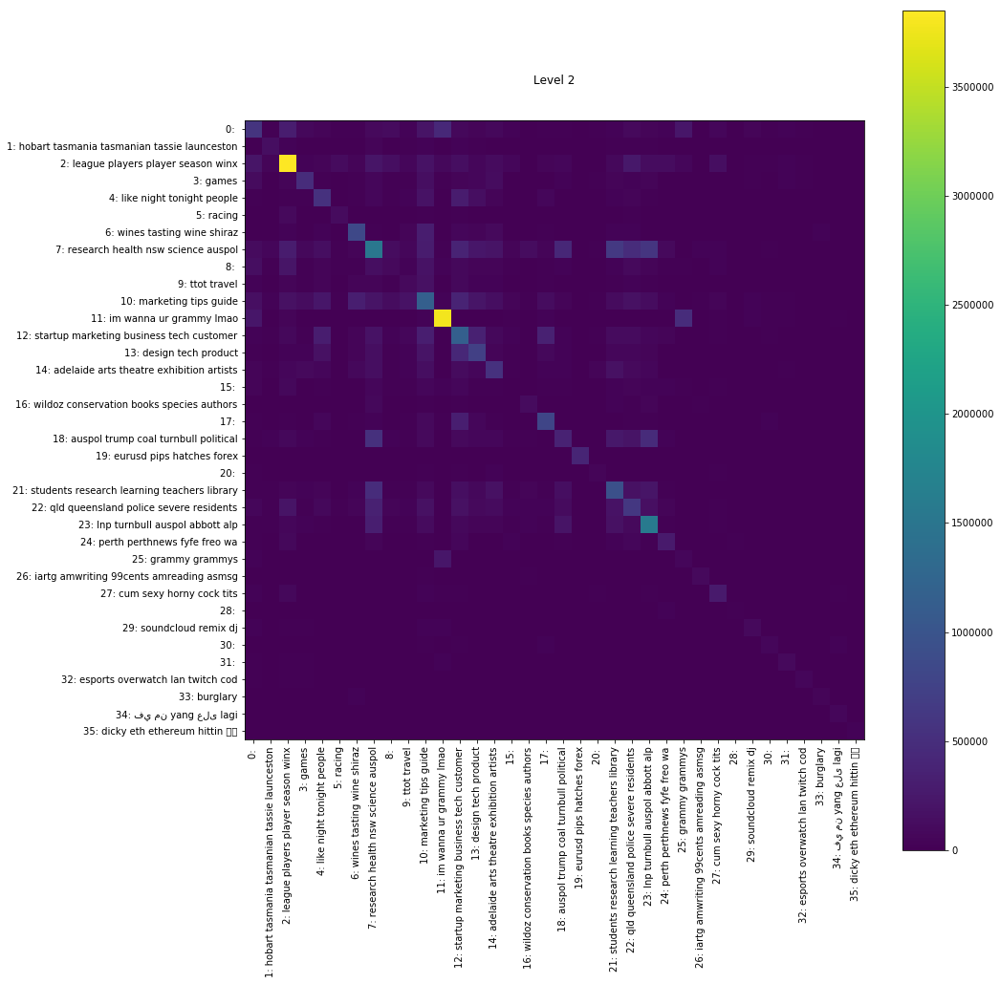

In [16]:
import matplotlib.ticker as ticker

def show_mat_for_level(level, projected_states, numeric_results, keyword_tables,
                       figsize=(15,15), treshold=0.05, num_keywords=5, min_n=100):
    
    fig = plt.figure(figsize=figsize)
    
    ax = fig.add_subplot(111)
    cax = ax.matshow(projected_states[level].get_matrix().todense())
    
    labels = ['{}: '.format(i) + ' '.join(
        numeric_results[level][i][numeric_results[level][i]['fraction'] > treshold].index.values[:num_keywords]
    ) if keyword_tables[level].loc[i]['n'] > min_n else str(i) for i in numeric_results[level]]
    
    ax.set_xticklabels([''] + labels, rotation='vertical')
    ax.set_yticklabels([''] + labels)
    ax.xaxis.set_major_locator(ticker.MultipleLocator(1))
    ax.yaxis.set_major_locator(ticker.MultipleLocator(1))
    ax.xaxis.set_ticks_position('bottom')
    
    plt.title('Level {}'.format(level))
    
    fig.colorbar(cax)
    
    plt.tight_layout()

    plt.show()
    
show_mat_for_level(2, projected_states, numeric_results, keyword_tables, (15,15))

remark: direction is x axis -[follows]-> y axis.

edge weight >  115498.56
n >  100


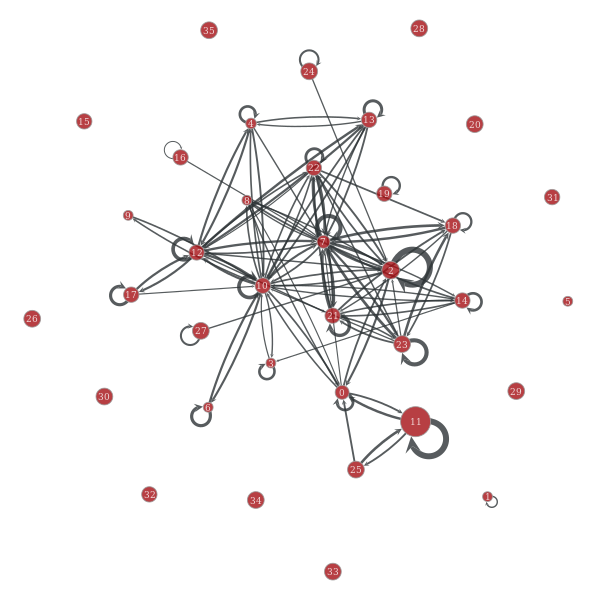

,n,keywords
level_2,,
0,4122,
1,840,"hobart, tasmania, tasmanian, tassie, launceston, politas"
2,9837,"league, players, player, season, winx, footy, match, game, nrl, afl, football, coach, rugby, cup, finals, teams, injury, clubs, win, goal, team"
3,2967,games
4,2833,"like, night, tonight, people"
5,1384,racing
6,1442,"wines, tasting, wine, shiraz"
7,6353,"research, health, nsw, science, auspol, coal, students, australia, indigenous, australian, report, govt, scientists, climate, policy, community, government, aboriginal, energy, evidence, program"
8,1184,


In [30]:
import pandas as pd

def draw_level_graph(projected_states, keyword_tables, level, treshold, min_n, distance=3, tune_distance=None,
                    vertex_size=30, edge_size=6, edge_min_size=1, filtering=True):

    state = projected_states[level]
    
    bg = state.get_bg()
    bg.ep['edge_count'] = state.mrs    # edge counts
    bg.vp['vertex_count'] = state.wr  # node counts
    bg.vp['active_accounts'] = bg.new_vertex_property('int', vals = keyword_tables[level]['n'])
    
    if filtering is True:
        print('edge weight > ', bg.ep['edge_count'].a.max() * treshold)
        print('n > ', min_n)
        bg = GraphView(bg,
                       efilt=lambda e: bg.ep['edge_count'][e] > bg.ep['edge_count'].a.max() * treshold,
                       vfilt=lambda v: bg.vp['active_accounts'][v] > min_n,
                      )
    
    pos = gt.draw.sfdp_layout(bg, eweight=bg.ep['edge_count'], p=distance, K=tune_distance)
    
    gt.draw.graph_draw(bg, pos=pos,
                       vprops={'size': gt.draw.prop_to_size(bg.vp['vertex_count'], ma=vertex_size),
                               'text': bg.vertex_index,
                               'text_position': -1, 'font_size': 9},
                       eprops={'pen_width': gt.draw.prop_to_size(bg.ep['edge_count'], mi=edge_min_size,
                                                                 ma=edge_size)}
                      )

draw_level_graph(projected_states, keyword_tables, level=2, treshold=0.03, min_n=100, distance=50)
pd.set_option('display.max_colwidth', 1000)
display(keyword_tables[2])

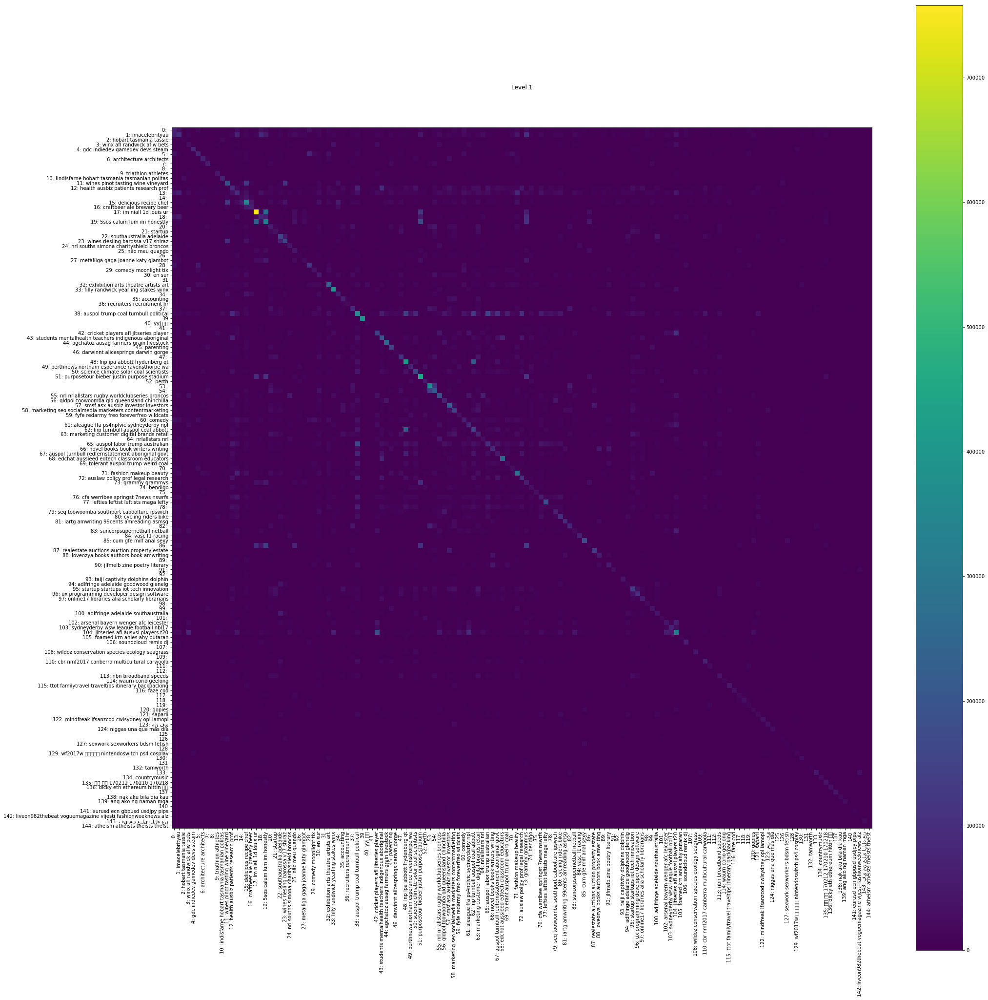

In [31]:
show_mat_for_level(1, projected_states, numeric_results, keyword_tables, (30,30))

edge weight >  7581.21
n >  100


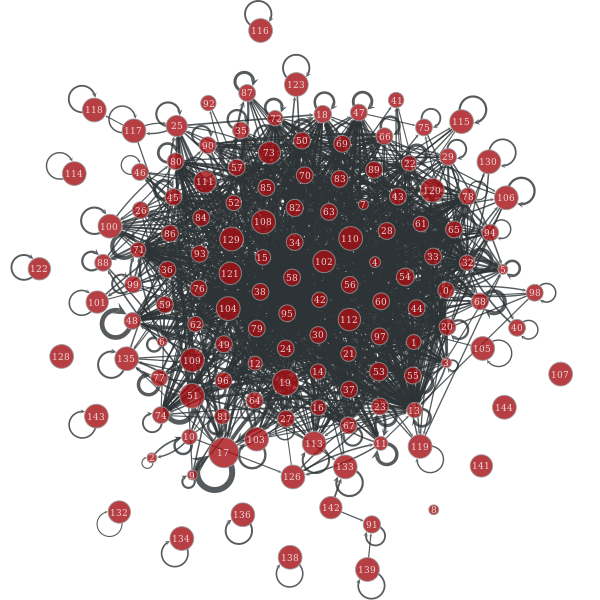

,n,keywords
level_1,,
0,1660,
1,1115,imacelebrityau
2,178,"hobart, tasmania, tassie"
3,721,"winx, afl, randwick, aflw, bets, sport"
4,1145,"gdc, indiedev, gamedev, devs, steam, games, comic, dev, overwatch, animation"
5,632,
6,425,"architecture, architects"
7,197,
8,171,


In [32]:
def show_level_graph(level, treshold=0.1, distance=3, min_n=100, tune_distance=None, edge_min_size=1, edge_size=6,
                    filtering=True):
    draw_level_graph(projected_states, keyword_tables, level=level, treshold=treshold, min_n=min_n, distance=distance,
                    tune_distance=tune_distance, edge_min_size=edge_min_size, edge_size=edge_size, filtering=filtering)
    pd.set_option('display.max_colwidth', 1000)
    pd.set_option('display.max_rows', 10000)
    
    display(keyword_tables[level])

show_level_graph(1, treshold=0.01, distance=30, min_n=100, tune_distance=None, filtering=True)

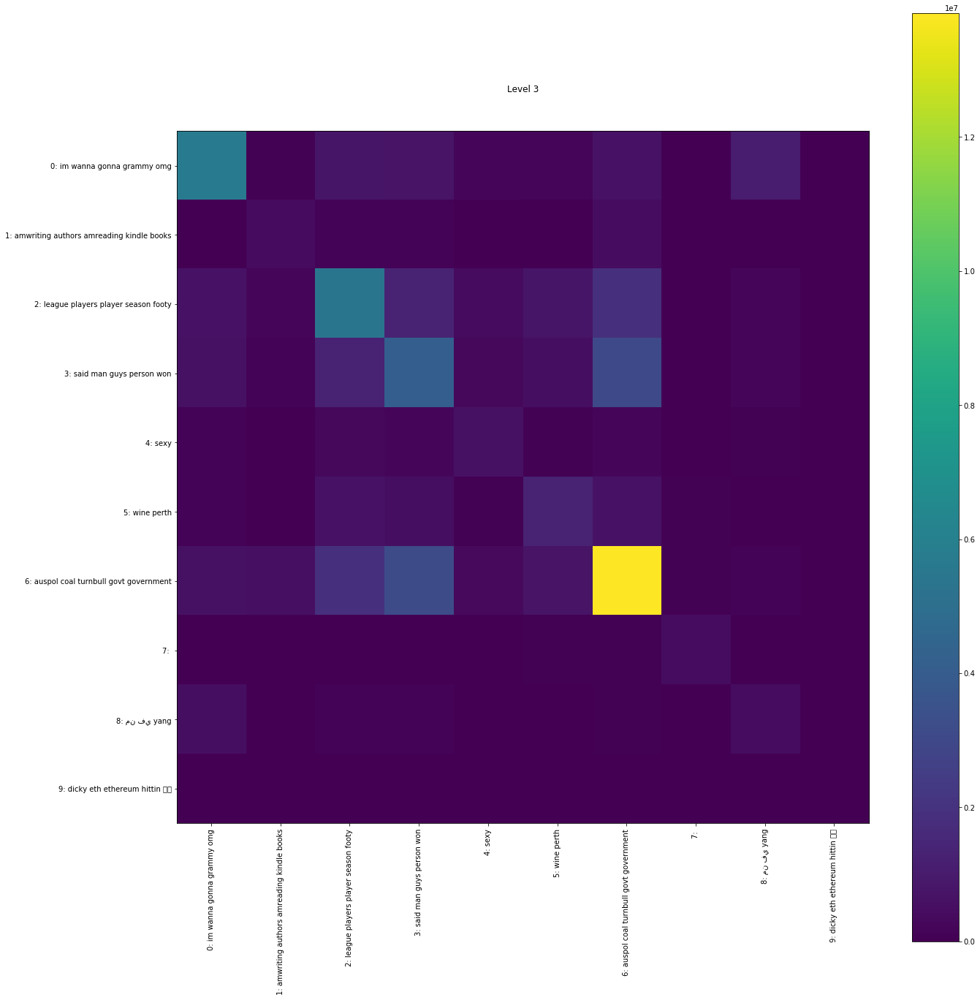

edge weight >  0
n >  100


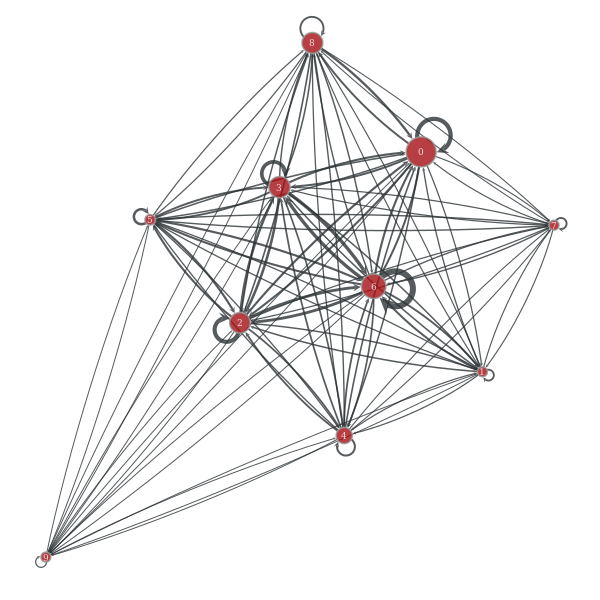

,n,keywords
level_3,,
0,23630,"im, wanna, gonna, grammy, omg, ur, cute, album, grammys, lmao, song, fuck, idk, honestly, bitch, fucking, crying, bc, yall, shook, literally, okay, girl, ass, cutest, music, shit, rn"
1,3353,"amwriting, authors, amreading, kindle, books, novel, romance, author"
2,16220,"league, players, player, season, footy, match, coach, afl, game, football, teams, cup, goal, win"
3,12765,"said, man, guys, person, won, hope, good, bad"
4,6883,sexy
5,3918,"wine, perth"
6,26240,"auspol, coal, turnbull, govt, government, policy, climate, renewables, labor, minister, nsw, parliament, nation, coalition, tax, lnp, malcolm, political, australian, politics, australians, renewable, energy, electricity, liberal, hanson, report, ndis, libs, qanda"
7,711,
8,11885,"من, في, yang"


In [35]:
show_mat_for_level(3, projected_states, numeric_results, keyword_tables, (20,20))
show_level_graph(3, treshold=0, min_n=100, distance=10)

# Try to normalise the result by the group sizes

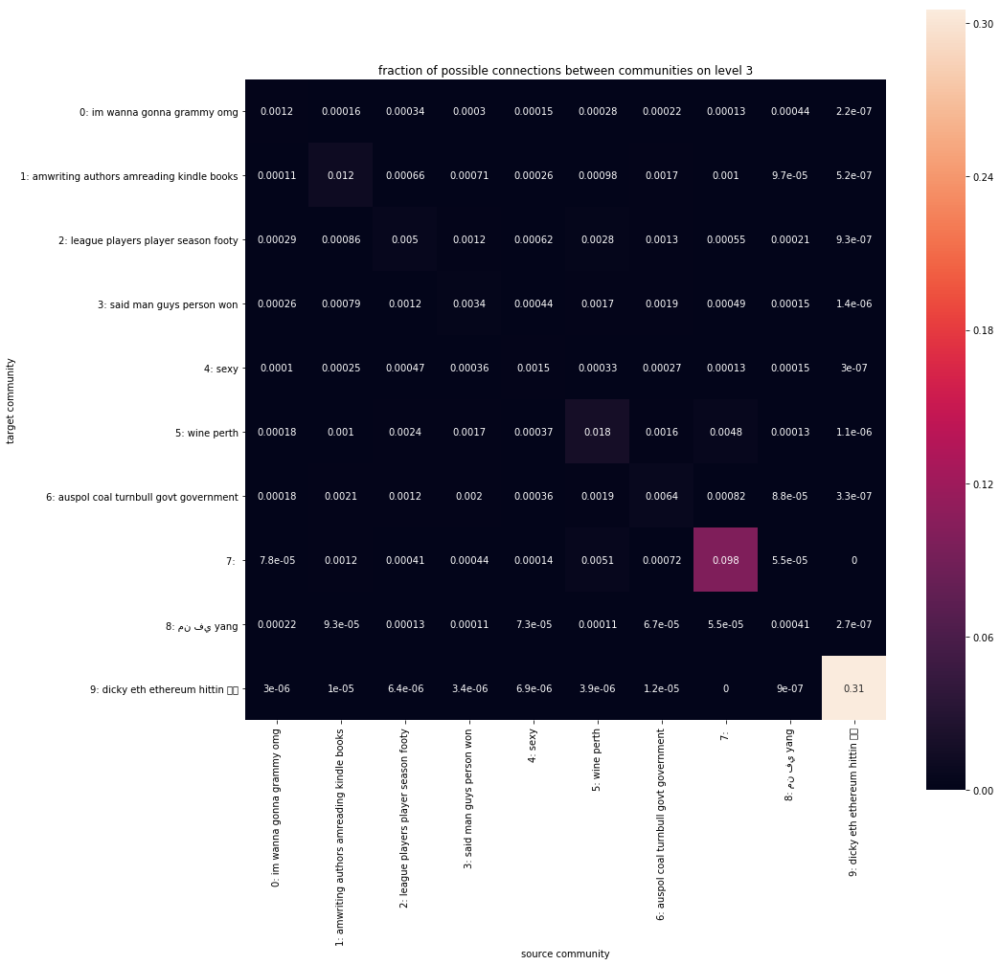

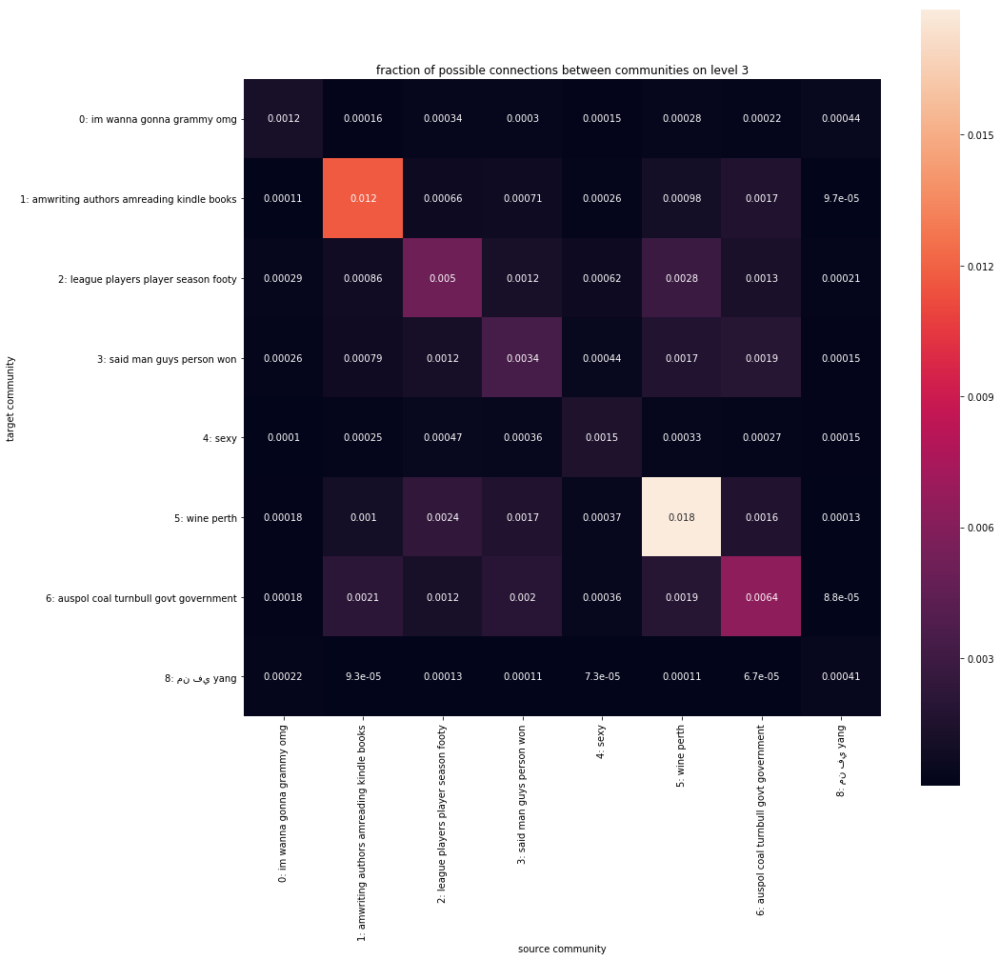

matrix([[  1.19452806e-03,   1.64810841e-04,   3.42535602e-04,
           2.97803780e-04,   1.54426268e-04,   2.84862194e-04,
           2.17143670e-04,   4.39714022e-04],
        [  1.09086492e-04,   1.17231595e-02,   6.63768727e-04,
           7.11040651e-04,   2.64948688e-04,   9.78589177e-04,
           1.65677271e-03,   9.72030452e-05],
        [  2.91900536e-04,   8.58691179e-04,   5.03166221e-03,
           1.21332872e-03,   6.24468303e-04,   2.80407011e-03,
           1.28007100e-03,   2.10557880e-04],
        [  2.59696074e-04,   7.94814165e-04,   1.17665355e-03,
           3.37762607e-03,   4.37913020e-04,   1.69805141e-03,
           1.89403372e-03,   1.48002166e-04],
        [  9.97372927e-05,   2.52109056e-04,   4.70327765e-04,
           3.55154050e-04,   1.49275404e-03,   3.30143004e-04,
           2.67911250e-04,   1.45165348e-04],
        [  1.83152972e-04,   1.02603844e-03,   2.36894540e-03,
           1.66108716e-03,   3.71993480e-04,   1.78746567e-02,
           1.6

In [58]:
import seaborn as sns


def show_norm_mat_for_level(level, projected_states, numeric_results, keyword_tables,
                       figsize=(15,15), treshold=0.05, num_keywords=5, min_n=100, filter_groups=[], annotate=True):
    
    def plot_norm_mat(normed_matrix, labels):

        fig, ax = plt.subplots(figsize=figsize)

        plt.title('fraction of possible connections between communities on level {}'.format(level))

        sns.heatmap(normed_matrix, square=True, annot=annotate, xticklabels=labels, yticklabels=labels, ax=ax)

        ax.set_xlabel('source community')
        ax.set_ylabel('target community')

        plt.show()
    
    state = projected_states[level]
    
    matrix = state.get_matrix().todense()
    
    numbers = np.array(state.get_nr().a)
    numbers.shape = (len(numbers), 1)  # make column vector
    numbers = numbers.astype('int64')
    
    max_possible_links = np.dot(numbers, numbers.transpose())  
    # (a,b,c) (a,     aa ab ac
    #          b, = ( ba bb bc )
    #          c)     ca cb cc
    
    normed_matrix = matrix / max_possible_links
    
    labels = ['{}: '.format(i) + ' '.join(
        numeric_results[level][i][numeric_results[level][i]['fraction'] > treshold].index.values[:num_keywords]
    ) if keyword_tables[level].loc[i]['n'] > min_n else str(i) for i in numeric_results[level]]
    
    plot_norm_mat(normed_matrix, labels)
    
    
    # filtered version from here
    
    matrix_mask = np.ones(matrix.shape, dtype=bool) 
    matrix_mask[[filter_groups]] = False
    matrix_mask[:, [filter_groups]] = False
    
    vector_mask = np.ones(numbers.shape, dtype=bool)
    vector_mask[[filter_groups]] = False

    numbers = numbers[vector_mask]
    numbers.shape = (len(numbers), 1)
    matrix = matrix[matrix_mask].reshape((len(numbers), len(numbers)))
    
    labels = [labels[i] for i in range(len(labels)) if i not in filter_groups]
    
    max_possible_links = np.dot(numbers, numbers.transpose())  
    # (a,b,c) (a,     aa ab ac
    #          b, = ( ba bb bc )
    #          c)     ca cb cc
    
    normed_matrix = matrix / max_possible_links

    plot_norm_mat(normed_matrix, labels)
    
    return normed_matrix
    
show_norm_mat_for_level(3, projected_states, numeric_results, keyword_tables, (15,15), filter_groups=[7,9])

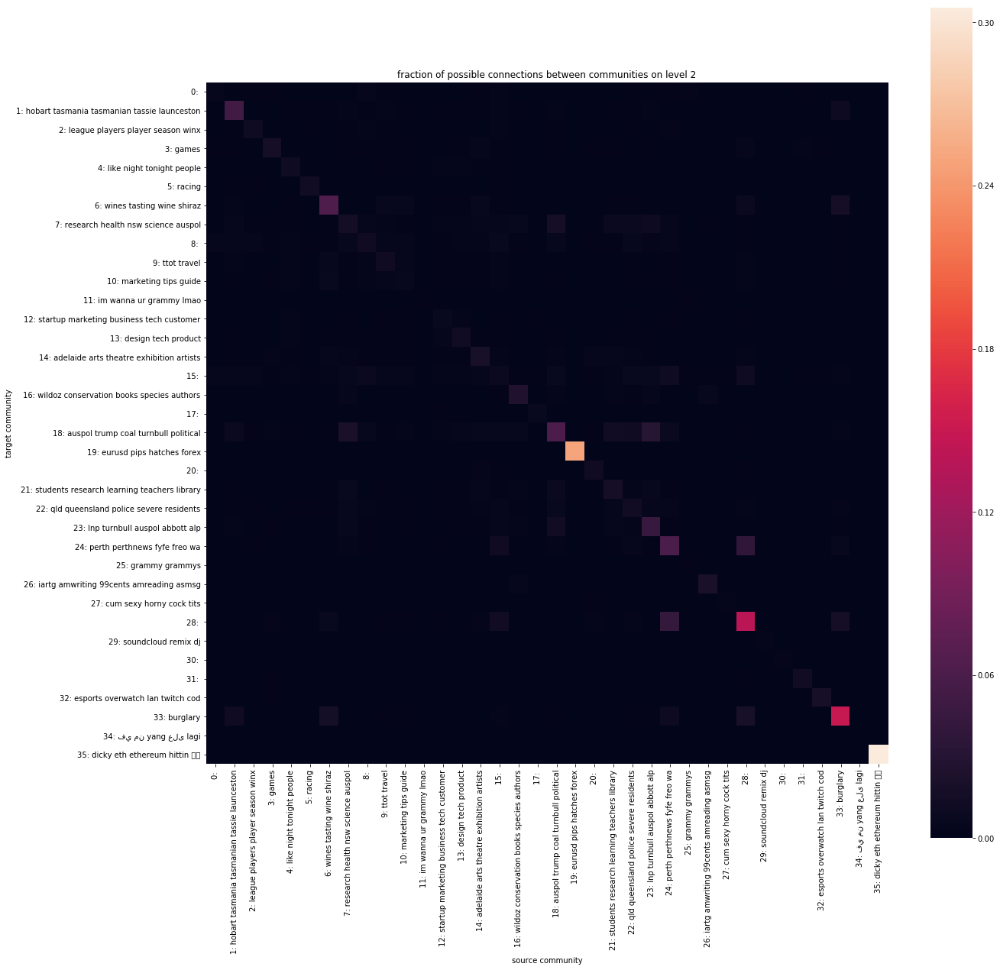

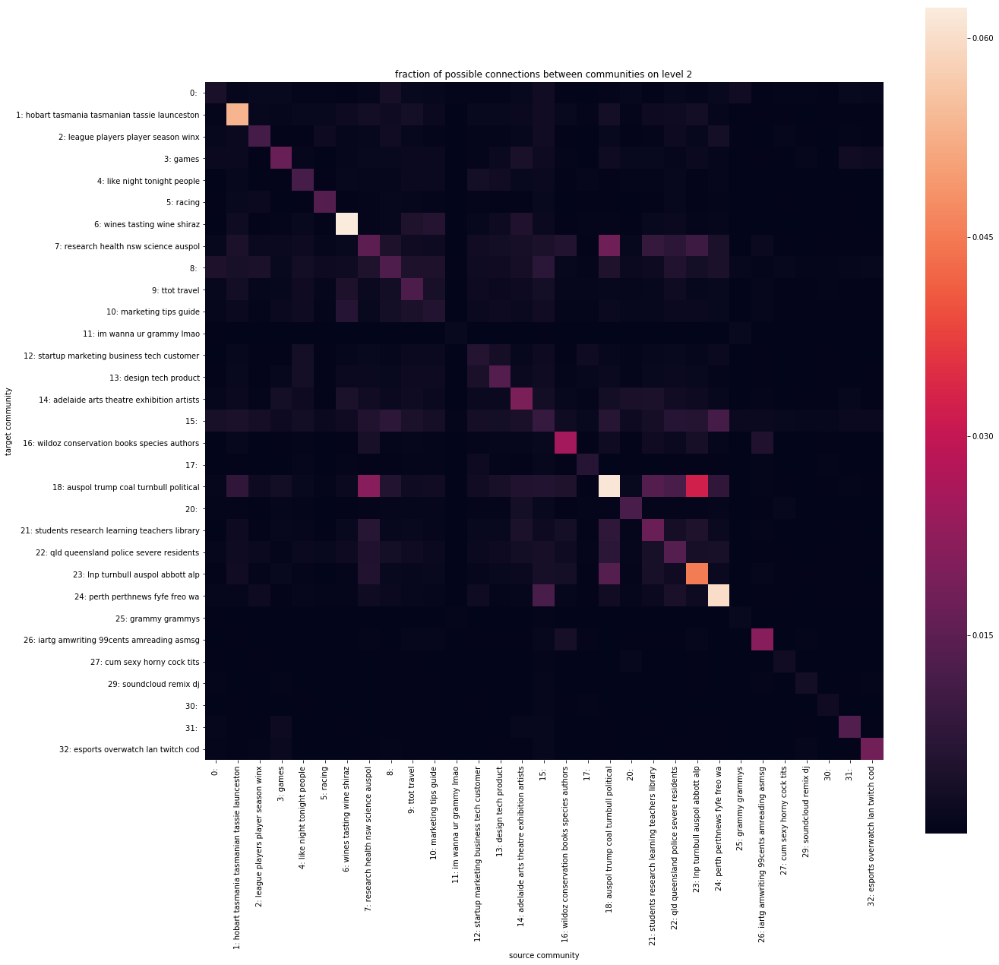

In [56]:
show_norm_mat_for_level(2, projected_states, numeric_results, keyword_tables, (20,20),
                        filter_groups=[19,35,28,33,34],
                        annotate=False)

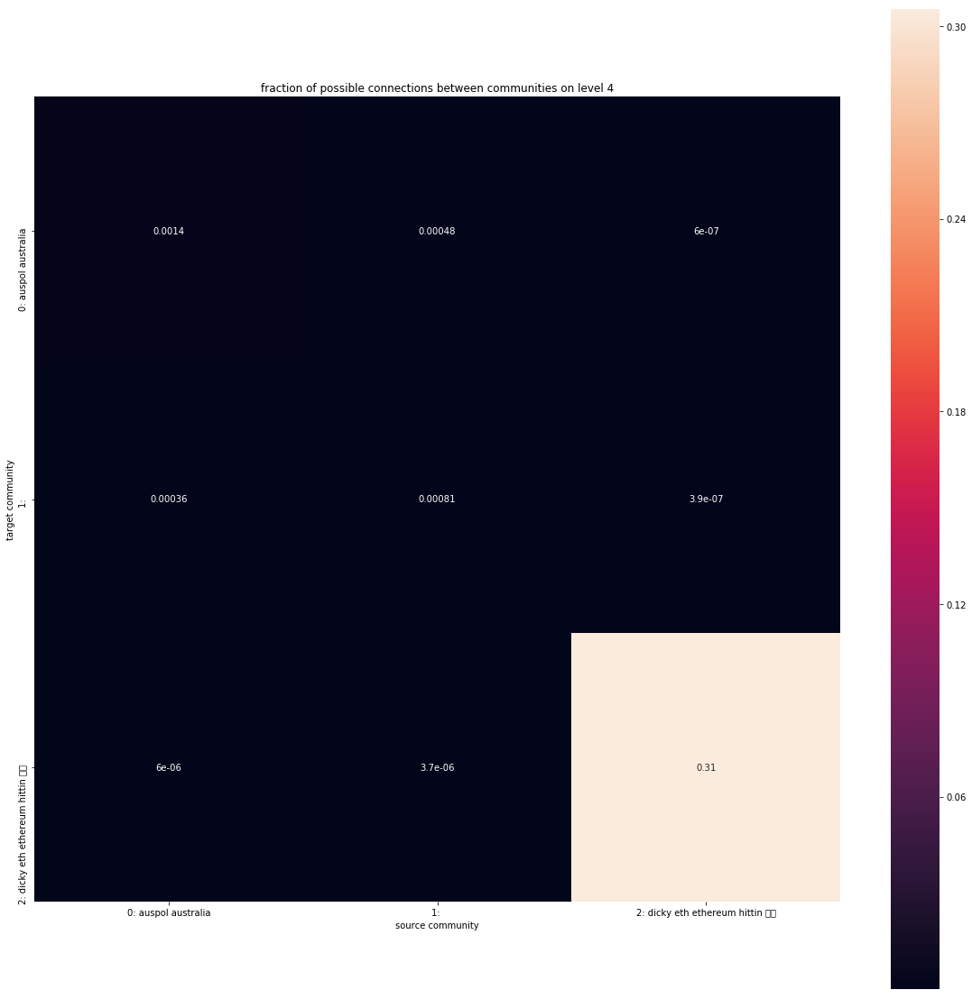

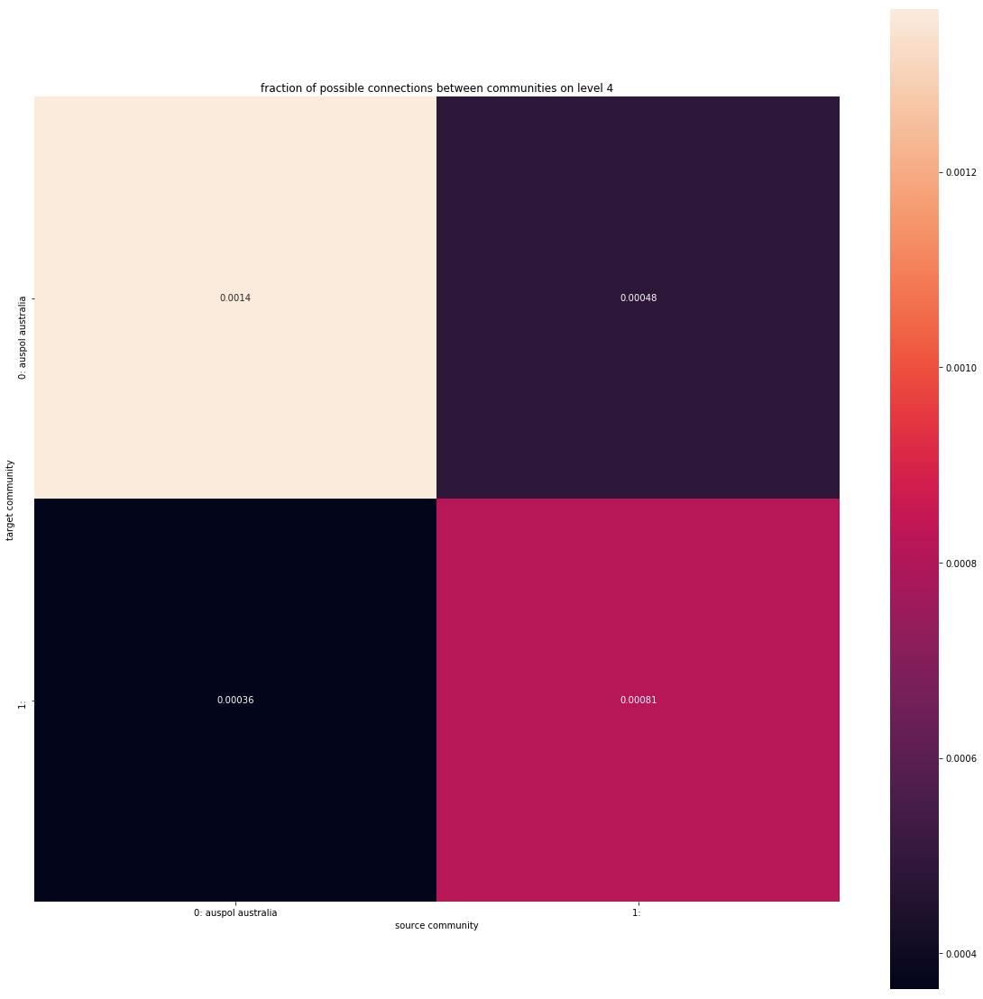

In [57]:
show_norm_mat_for_level(4, projected_states, numeric_results, keyword_tables, (20,20),
                        filter_groups=[2])

# Order communities by hierarchical clustering

In [80]:
tree_data = hf.load_from_pickle('../../data/austwittersphere1000/1000plus_SBM_tree_data_with_words.pickle')

In [162]:
def get_index_from_tree_data(tree_data, level):
    
    result = tree_data.drop(['keywords', 'n'], axis=1)
    result = result.drop([str(i) for i in range(level)], axis=1)
    result = result.sort_values(list(result.columns))
    
    result = result[[str(level + 1), str(level)]].drop_duplicates()
    
    return result
    
get_index_from_tree_data(tree_data, 3)

,4,3
0,0,0
3,0,2
6,0,3
12,0,6
2,1,1
9,1,4
11,1,5
48,1,7
116,1,8
501,2,9


In [104]:
index = get_index_from_tree_data(tree_data, 4)

new_matrix = matrix[np.ix_(index['4'].values, index['4'].values)]
display(new_matrix, matrix)

matrix([[  1.36692651e-03,   4.80673927e-04,   5.99922310e-07],
        [  3.62979013e-04,   8.14727728e-04,   3.89027757e-07],
        [  6.01588761e-06,   3.71737635e-06,   3.05342798e-01]])

matrix([[  1.36692651e-03,   4.80673927e-04,   5.99922310e-07],
        [  3.62979013e-04,   8.14727728e-04,   3.89027757e-07],
        [  6.01588761e-06,   3.71737635e-06,   3.05342798e-01]])

In [165]:
def show_norm_mat_for_level(level, projected_states, numeric_results, keyword_tables, tree_data,
                       figsize=(15,15), treshold=0.05, num_keywords=5, min_n=0,
                        annotate=True, per=1, log=False):
    
    def plot_norm_mat(normed_matrix, labels):

        fig, ax = plt.subplots(figsize=figsize)
        
        if log is True:
            ticks = np.arange(0, int(normed_matrix.max()) +1)
            plt.title('log_10 of number of links (+ 1) per {} possible links'.format(per))
            sns.heatmap(normed_matrix, square=True, annot=False, ax=ax, xticklabels=labels, yticklabels=labels,
                    cbar_kws={'ticks': ticks}
                   )
        else:

            plt.title('fraction of possible connections between communities on level {}'.format(level))

            sns.heatmap(normed_matrix, square=True, annot=annotate, xticklabels=labels, yticklabels=labels, ax=ax)

        ax.set_xlabel('source community')
        ax.set_ylabel('target community')

        plt.show()
    
    state = projected_states[level]
    
    matrix = state.get_matrix().todense()
    
    numbers = np.array(state.get_nr().a)
    numbers.shape = (len(numbers), 1)  # make column vector
    numbers = numbers.astype('int64')
    
    max_possible_links = np.dot(numbers, numbers.transpose())  
    # (a,b,c) (a,     aa ab ac
    #          b, = ( ba bb bc )
    #          c)     ca cb cc
    
    normed_matrix = per * (matrix / max_possible_links)
    
    sorted_index = get_index_from_tree_data(tree_data, level)
        
    normed_matrix = normed_matrix[np.ix_(sorted_index[str(level)].values, sorted_index[str(level)].values)]
    
    if log is True:
        normed_matrix = np.log10(normed_matrix + 1)
    
    labels = [' '.join(
        numeric_results[level][i][numeric_results[level][i]['fraction'] > treshold].index.values[:num_keywords]
    ) if keyword_tables[level].loc[i]['n'] > min_n else str(i) for i in numeric_results[level]]
    
    labels = [labels[i] for i in sorted_index[str(level)].values]
    
    sorted_index['labels'] = labels
    
    for column in sorted_index.columns[::-1][1:]:
        sorted_index['labels'] = sorted_index[column].astype(str) + "/" + sorted_index["labels"]
    
    labels = sorted_index['labels']
    
    plot_norm_mat(normed_matrix, labels)
       
    return normed_matrix

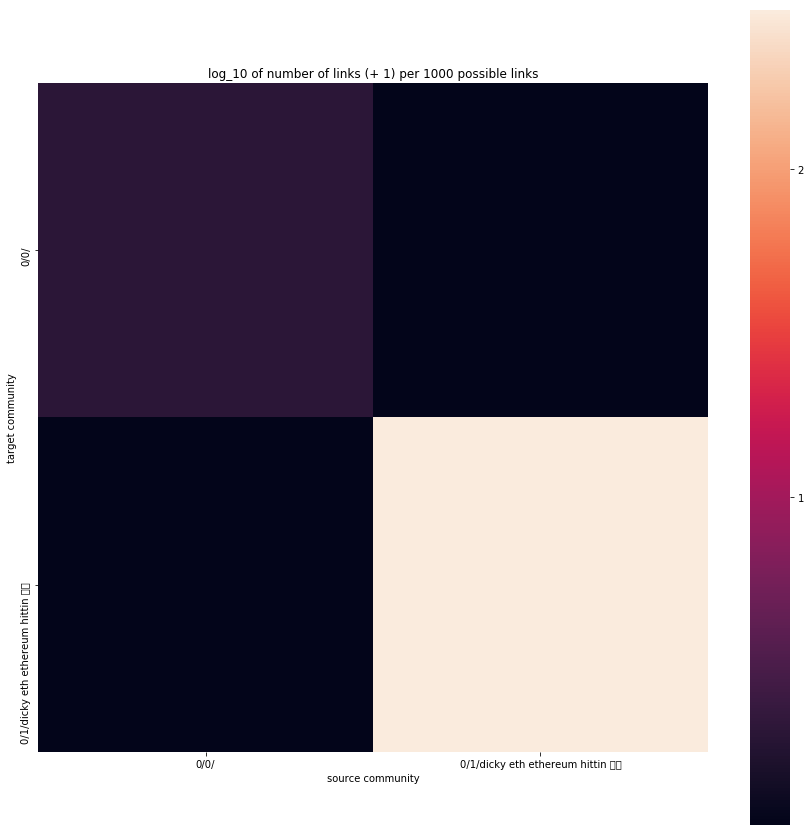

In [166]:
matrix = show_norm_mat_for_level(5, projected_states, numeric_results, keyword_tables, tree_data, (15,15),
                                 log=True,
                                 per=1000)

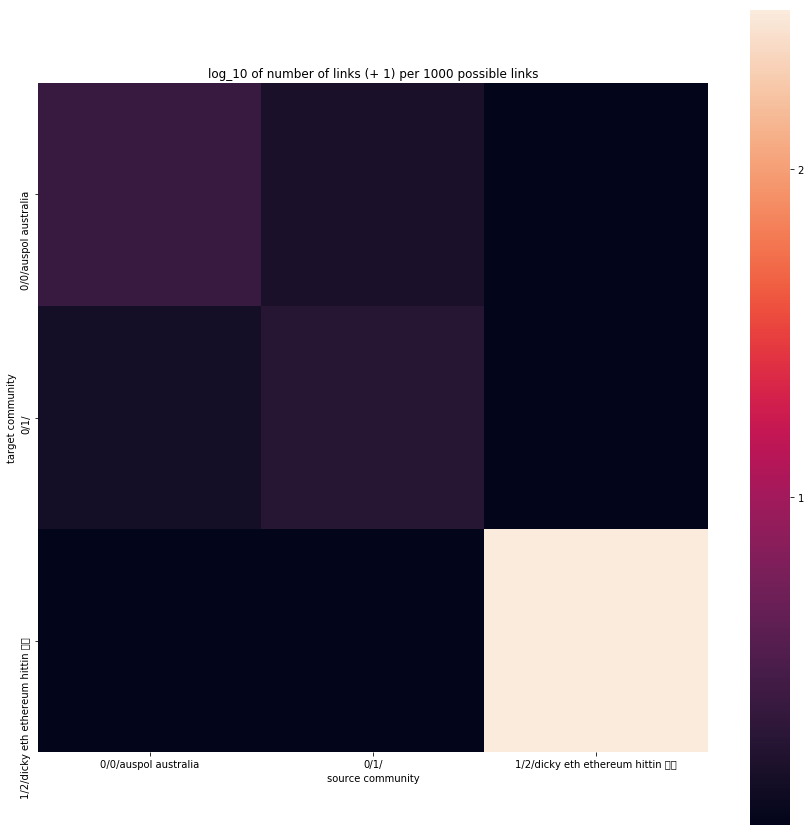

In [167]:
matrix = show_norm_mat_for_level(4, projected_states, numeric_results, keyword_tables, tree_data, (15,15),
                                 log=True,
                                 per=1000)

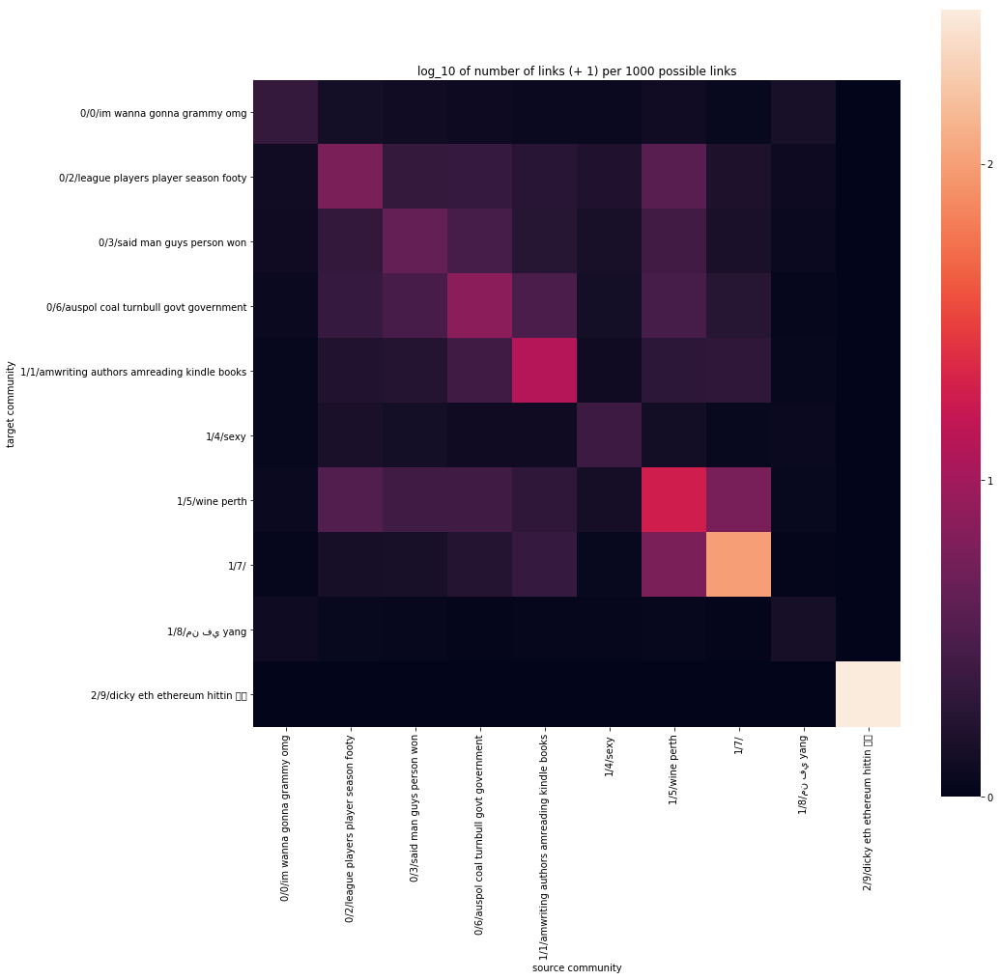

In [168]:
matrix = show_norm_mat_for_level(3, projected_states, numeric_results, keyword_tables, tree_data, (15,15),
                                 log=True,
                                 per=1000)

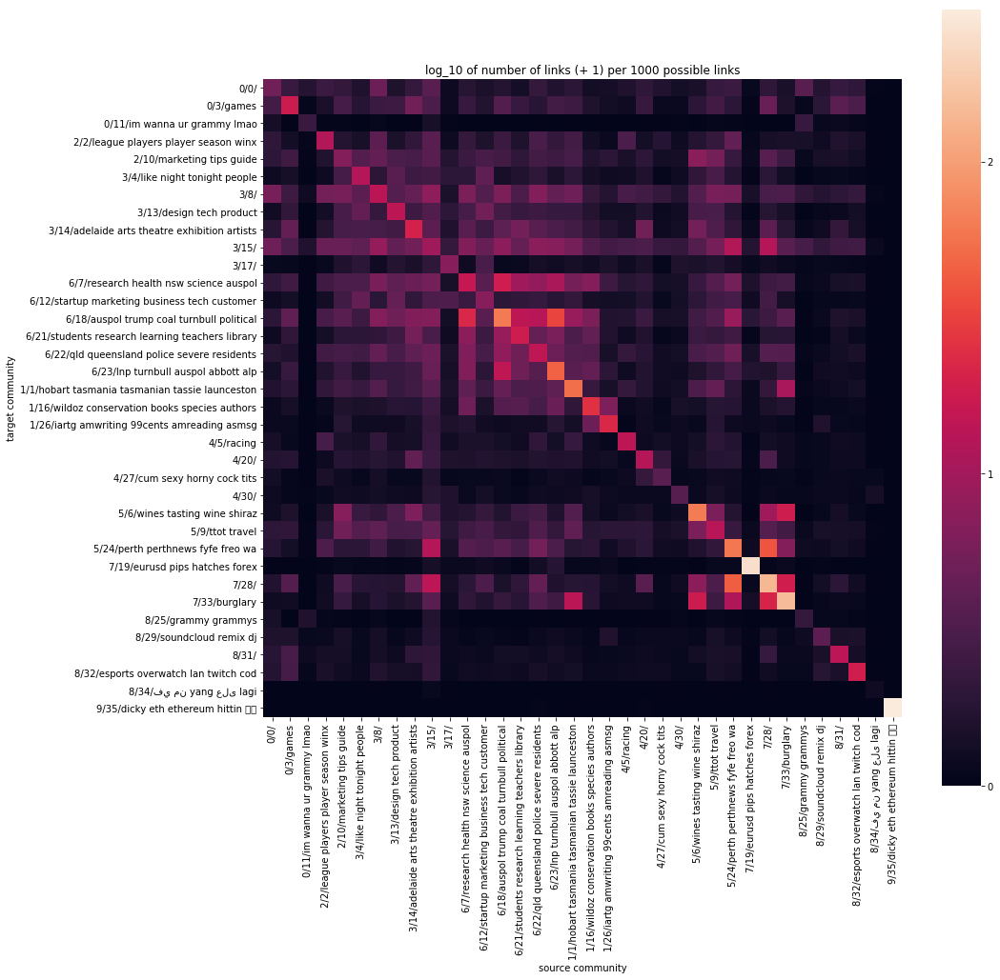

In [169]:
matrix = show_norm_mat_for_level(2, projected_states, numeric_results, keyword_tables, tree_data, (15,15),
                                 log=True,
                                 per=1000)

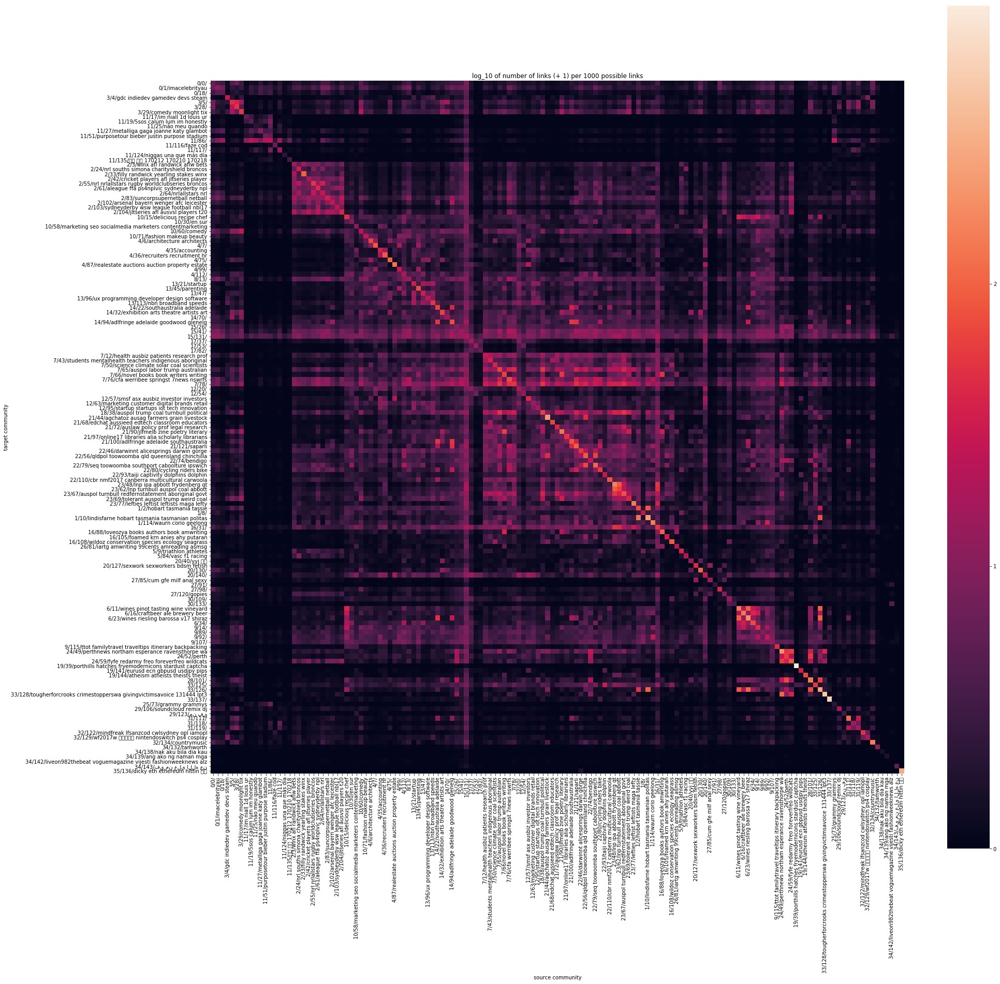

In [172]:
matrix = show_norm_mat_for_level(1, projected_states, numeric_results, keyword_tables, tree_data, (30,30),
                                 log=True,
                                 per=1000)

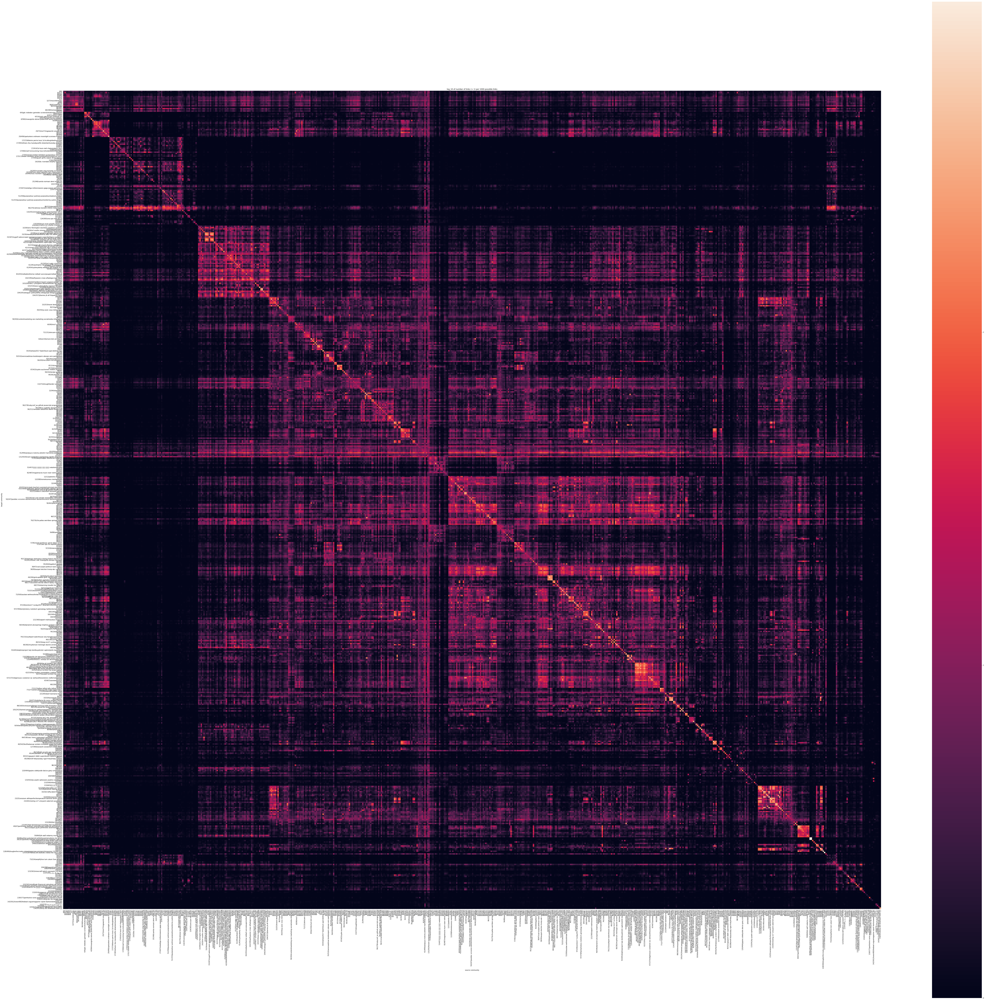

In [178]:
matrix = show_norm_mat_for_level(0, projected_states, numeric_results, keyword_tables, tree_data, (120,120),
                                 log=True,
                                 per=1000)